# Import Packages

In [56]:
import pandas as pd
import seaborn as sns
sns.set(style='darkgrid')
import matplotlib.pyplot as plt
import math
import numpy as np
%matplotlib inline
%config IPCompleter.greedy=True

# df = pd.read_csv('../data/df_model_untrimmed.csv')
df = pd.read_csv('../data/df_model_trimmed.csv') # use trimmed data

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, confusion_matrix, f1_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
import itertools
from collections import Counter
pd.options.display.max_columns = 999

In [57]:
df.head(2)

,year,company,auwgr,lkpp,hlr_lag1,hlr_lag2,hlr_lag3,hlr_lag4,hlr_lag5,mer,der,oer,prem_write_net_lag1,claim_set_net_lag1,exp_management_lag1,exp_comm_incur_net_lag1,exp_other_lag1,prem_liab_diff_lag1,claim_liab_diff_lag1,uw_gain_lag1,class_bonds,class_cnstr_engr,class_cpr,class_fire,class_health,class_mac,class_mahl,class_motor,class_others,class_pa,class_prof_indm,class_pub_lia,class_wic
0,2005,c166,1.403847,9.746642,-0.653108,-0.67628,-0.702346,-0.71422,-0.734678,-0.295015,0.527893,-0.007879,2.444520e+06,-253062.0,-686827.538462,1.228995e+06,-18342.384615,-14542.307692,16797.923077,2.717538e+06,0,0,0,0,0,0,0,0,0,1,0,0,0
1,2006,c166,1.897721,4.531747,-0.950801,-0.67628,-0.702346,-0.71422,-0.734678,-0.334269,1.003505,-0.013498,1.663251e+06,-554426.0,-529499.000000,1.589601e+06,-21381.000000,156169.000000,31235.000000,2.334950e+06,0,0,0,0,0,0,0,0,0,1,0,0,0


In [58]:
df.shape

(4347, 33)

# Prepare Features and Target

## Impute classification
Negative class '0': uw_gain < 0
Positive class '1': uw_gain >= 0

In [59]:
df['classification'] = [0 if i<0 else 1 for i in df['auwgr']]

In [60]:
print(df[(df['auwgr']<0) & (df['classification']==0)].count().values[0])
print(df[(df['auwgr']>=0) & (df['classification']==1)].count().values[0])

1388
2959


## Extract Features

In [61]:
print(df.shape)
features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
print(features)

(4347, 34)
['lkpp', 'hlr_lag1', 'hlr_lag2', 'hlr_lag3', 'hlr_lag4', 'hlr_lag5', 'mer', 'der', 'oer', 'prem_write_net_lag1', 'claim_set_net_lag1', 'exp_management_lag1', 'exp_comm_incur_net_lag1', 'exp_other_lag1', 'prem_liab_diff_lag1', 'claim_liab_diff_lag1', 'uw_gain_lag1', 'class_bonds', 'class_cnstr_engr', 'class_cpr', 'class_fire', 'class_health', 'class_mac', 'class_mahl', 'class_motor', 'class_others', 'class_pa', 'class_prof_indm', 'class_pub_lia', 'class_wic']


**NOTE:**<br>
In a previous iteration of feature engineering, the 13 classes of insurance ('class_* ') were dropped. However, this did not appear to have any effect on the accuracy/scores of the models belows. Therefore, we have decided to leave them in for now.

In [62]:
X = df[features]
y = df['classification']
print(X.shape)
print(y.shape)

(4347, 30)
(4347,)


# Baseline Accuracy

In [63]:
df['classification'].value_counts(normalize=True).sort_index()

0    0.319301
1    0.680699
Name: classification, dtype: float64

**Baseline Accuracy is** $0.67$

# Preparation

## Train/Test Split Data

In [64]:
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(3260, 30) (1087, 30)
(3260,) (1087,)


## Define Functions and Variables

In [65]:
# Variables (and their assignments) to be used in the following functions. 
thresholds = np.linspace(0, 1, 200)
labels_list = ['Negative UWG (0)','Positive UWG (1)']
y_label = 'Frequency'
x_label = 'Predicted Probability of Positive UWG (1)'

# pred_proba_list = [i[1] for i in classifier.predict_proba(predictors)]

In [66]:
def plot_distr_of_outcomes(pred_proba_list, true_values, 
                                  class_labels, plot_title, ylabel, xlabel, v_line_ht=200, fig_size=(10,6)):
    
    pred_df = pd.DataFrame({'true_values': true_values,'pred_probs':pred_proba_list})
    
    plt.figure(figsize = fig_size)
    plt.hist(pred_df[pred_df['true_values'] == 0]['pred_probs'],bins=25,color='b',alpha = 0.6, label=class_labels[0])
    plt.hist(pred_df[pred_df['true_values'] == 1]['pred_probs'],bins=25,color='orange',alpha = 0.6, label=class_labels[1])
    plt.title(plot_title, fontsize=14)
    plt.ylabel(ylabel, fontsize=12)
    plt.xlabel(xlabel, fontsize=12)
    plt.legend(fontsize=12)
    plt.vlines(x=0.5,ymin = 0,ymax = v_line_ht,color='darkgreen',linestyle = '--')
    plt.show()
    return None

In [67]:
# Define function to calculate sensitivity. (True positive rate.)
def TPR(df, true_col, pred_prob_col, threshold):
    true_positive = df[(df[true_col] == 1) & (df[pred_prob_col] >= threshold)].shape[0]
    false_negative = df[(df[true_col] == 1) & (df[pred_prob_col] < threshold)].shape[0]
    return true_positive / (true_positive + false_negative)
    
# Define function to calculate 1 - specificity. (False positive rate.)
def FPR(df, true_col, pred_prob_col, threshold):
    true_negative = df[(df[true_col] == 0) & (df[pred_prob_col] <= threshold)].shape[0]
    false_positive = df[(df[true_col] == 0) & (df[pred_prob_col] > threshold)].shape[0]
    return 1 - (true_negative / (true_negative + false_positive))

# plot_title='Extra Trees Classifier: ROC Curve with AUC'
def plot_roc(pred_proba_list, true_values, plot_title='ROC Curve with AUC', fig_size=(10,6)):

    pred_df = pd.DataFrame({'true_values': true_values,'pred_probs':pred_proba_list})
    
    # Calculate sensitivity & 1-specificity for each threshold between 0 and 1.
    tpr_values = [TPR(pred_df, 'true_values', 'pred_probs', prob) for prob in thresholds]
    fpr_values = [FPR(pred_df, 'true_values', 'pred_probs', prob) for prob in thresholds]

    plt.figure(figsize = fig_size)
    # Plot ROC curve.
    plt.plot(fpr_values, # False Positive Rate on X-axis
             tpr_values, # True Positive Rate on Y-axis
             label='ROC Curve')
    
    # Plot baseline. (Perfect overlap between the two populations.)
    plt.plot(np.linspace(0, 1, 200), np.linspace(0, 1, 200), label='baseline', linestyle='--')
    plt.title(f'{plot_title} = {round(roc_auc_score(pred_df["true_values"],pred_df["pred_probs"]),3)}',fontsize=14)
    plt.ylabel('Sensitivity', fontsize=12)
    plt.xlabel('1 - Specificity', fontsize=12)
    plt.legend(fontsize=12);
    return None

# Models

## Logistic Regression Classifier

In [68]:
# lr = LogisticRegression(fit_intercept=False,C=1.0,tol=0.0001,penalty='l2')
lr = LogisticRegression(solver='lbfgs')
lr.fit(X_train,y_train)
print('Score(train/test):',lr.score(X_train, y_train),',',lr.score(X_test, y_test))
# print('Score (test):\t',lr.score(X_test, y_test))
print('\n=== Classification Report  ================================')
# predict & evaluate
predictions = lr.predict(X_test)
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))
# tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
# print('TP:',tp,'\tTN:',tn)
# print('FP:',fp,'\tFN:',fn)
# print('F1:',f1_score(y_test, predictions))
# print('Acc:',1-(fp+fn)/len(predictions))

Score(train/test): 0.7230061349693252 , 0.7212511499540019

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.58      0.44      0.50       347
Positive AUWGR (1)       0.76      0.85      0.81       740

          accuracy                           0.72      1087
         macro avg       0.67      0.65      0.65      1087
      weighted avg       0.71      0.72      0.71      1087



### Plot Distribution of Outcomes

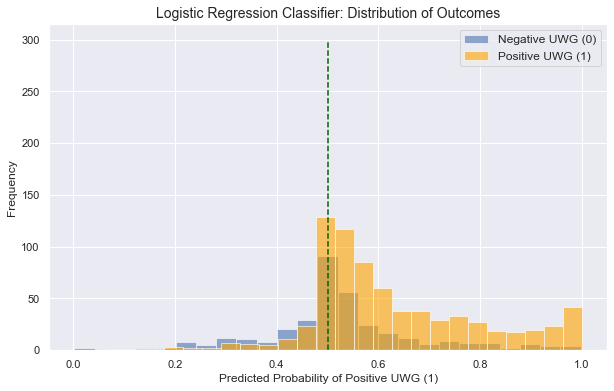

In [69]:
v_line_max = 300
plot_title = 'Logistic Regression Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in lr.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

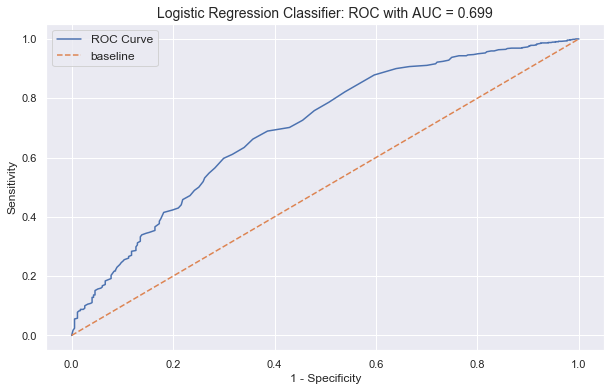

In [70]:
plot_title = 'Logistic Regression Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

## Decision Tree Classifier

In [71]:
# use default parameters
dtcf = DecisionTreeClassifier()
dtcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',lr.score(X_train, y_train),',',lr.score(X_test, y_test))
# predict & evaluate
predictions = dtcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 0.7230061349693252 , 0.7212511499540019

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.43      0.48      0.45       347
Positive AUWGR (1)       0.74      0.71      0.72       740

          accuracy                           0.63      1087
         macro avg       0.59      0.59      0.59      1087
      weighted avg       0.64      0.63      0.64      1087



### Plot Decision Tree Graph

In [21]:
#pip install pydotplus

In [72]:
# brew install graphviz
# Use graphviz to make a chart of the regression tree decision points:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

In [73]:
dot_data = StringIO()  

export_graphviz(dtcf, out_file=dot_data,  
                filled=True, rotate=True, rounded=True,
                special_characters=True)  

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

### (!!WIP) Findings from Decision Tree Graph

Upon inspection of the above graph, 

## Random Forest Classifier

In [74]:
# use default parameters
rfcf = RandomForestClassifier(n_estimators=10)
rfcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',rfcf.score(X_train, y_train),',',rfcf.score(X_test, y_test))
# predict & evaluate
predictions = rfcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 0.9889570552147239 , 0.7000919963201472

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.53      0.50      0.52       347
Positive AUWGR (1)       0.77      0.79      0.78       740

          accuracy                           0.70      1087
         macro avg       0.65      0.65      0.65      1087
      weighted avg       0.70      0.70      0.70      1087



### Plot Distribution of Outcomes

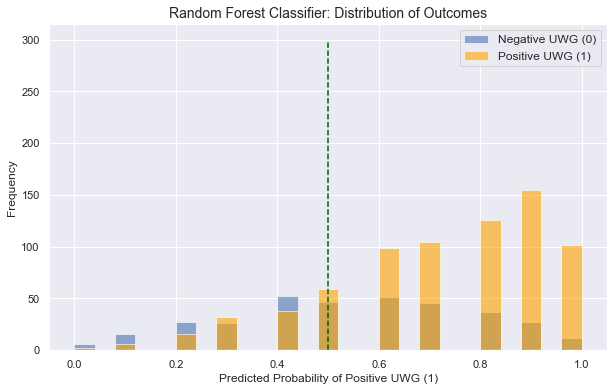

In [75]:
v_line_max = 300
plot_title = 'Random Forest Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in rfcf.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

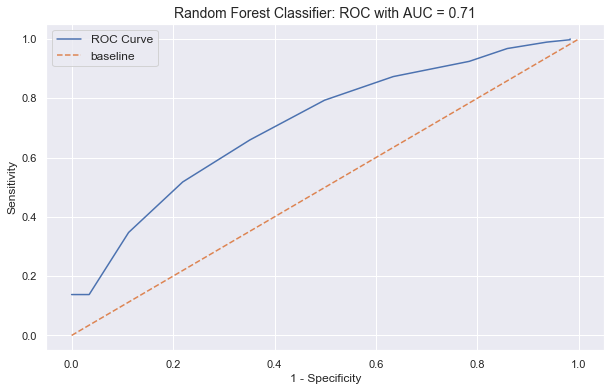

In [76]:
plot_title = 'Random Forest Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

## Extra Trees Classifier

In [80]:
etcf = ExtraTreesClassifier(bootstrap=True,oob_score=True,warm_start=False,n_estimators=100)
etcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',etcf.score(X_train, y_train),',',etcf.score(X_test, y_test))
# predict & evaluate
predictions = etcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 1.0 , 0.7470101195952162

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.66      0.44      0.53       347
Positive AUWGR (1)       0.77      0.89      0.83       740

          accuracy                           0.75      1087
         macro avg       0.71      0.66      0.68      1087
      weighted avg       0.73      0.75      0.73      1087



### GridSearchCV

The following Grid Search was carried out on Google Colab.

In [22]:
# params = [{'n_estimators':[100,200,300],
#                'max_depth':range(2,10),
#                'min_samples_split':range(2,20),
#                'oob_score':[True],
#                'bootstrap':[True]
#               }]

# gs = GridSearchCV(ExtraTreesClassifier(), param_grid=params, cv=5)
# gs.fit(X_train, y_train)
# gs.best_params_

The Grid Search returned the following best_params_:<br>
*{'bootstrap': True,
 'max_depth': 2,
 'min_samples_split': 2,
 'n_estimators': 100,
 'oob_score': True}*

In [79]:
# use the best_params_ given by the Grid Search above - 
etcf = ExtraTreesClassifier(bootstrap=True,max_depth=2,min_samples_split=2,n_estimators=250,oob_score=True)
etcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',etcf.score(X_train, y_train),',',etcf.score(X_test, y_test))
# predict & evaluate
predictions = etcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 0.6806748466257668 , 0.6807727690892365

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.00      0.00      0.00       347
Positive AUWGR (1)       0.68      1.00      0.81       740

          accuracy                           0.68      1087
         macro avg       0.34      0.50      0.41      1087
      weighted avg       0.46      0.68      0.55      1087



C:\Users\XXX\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Plot Distribution of Outcomes

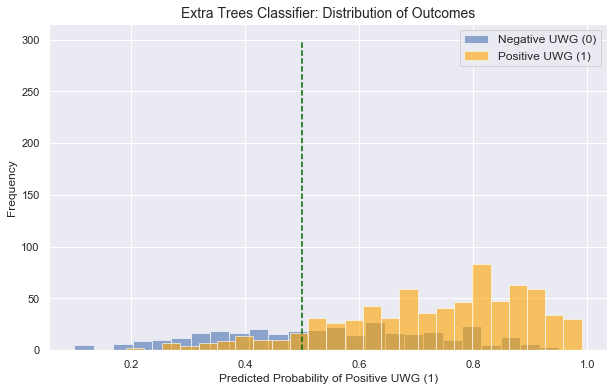

In [81]:
v_line_max = 300
plot_title = 'Extra Trees Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in etcf.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

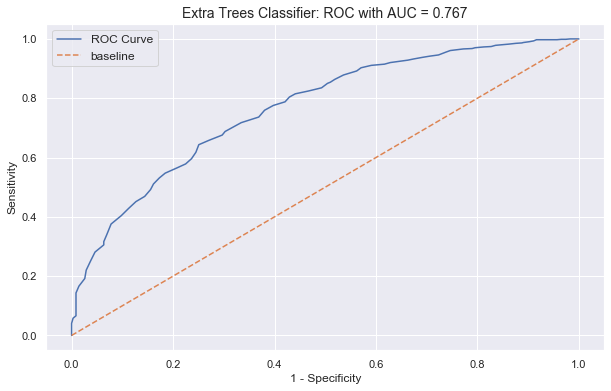

In [82]:
plot_title = 'Extra Trees Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

### Segregate by Insurance Type

Baseline accuracy for "class_bonds": 0.7591836734693878
Shape (train/test): (183, 31) (62, 31)
Test Score (min/max): 0.7903225806451613  ,  0.967741935483871


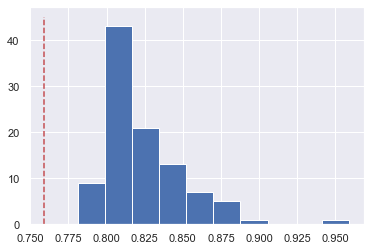

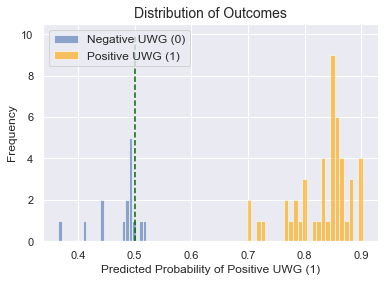

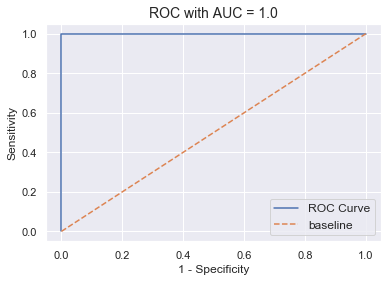

Baseline accuracy for "class_cnstr_engr": 0.7380952380952381
Shape (train/test): (220, 31) (74, 31)
Test Score (min/max): 0.7432432432432432  ,  1.0


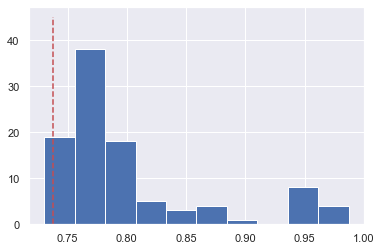

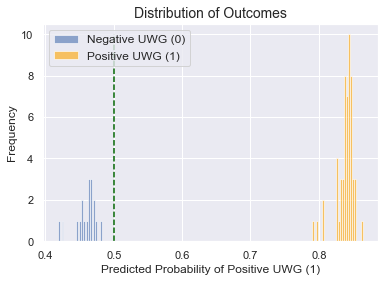

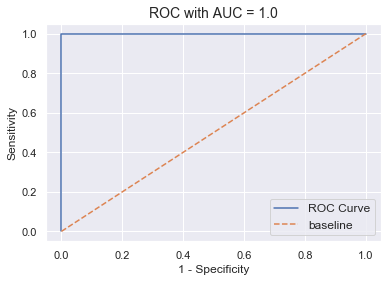

Baseline accuracy for "class_cpr": 0.5176470588235295
Shape (train/test): (63, 31) (22, 31)
Test Score (min/max): 1.0  ,  1.0


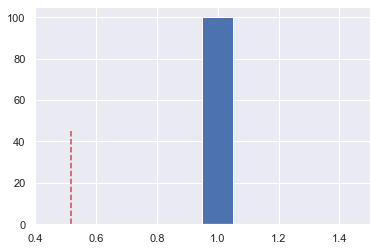

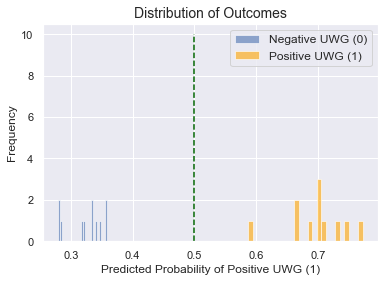

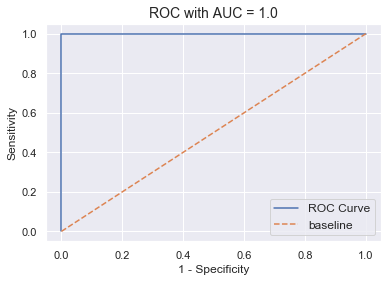

Baseline accuracy for "class_fire": 0.7475915221579962
Shape (train/test): (389, 31) (130, 31)
Test Score (min/max): 0.7538461538461538  ,  0.9769230769230769


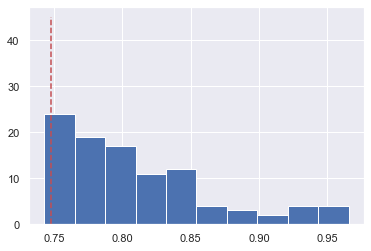

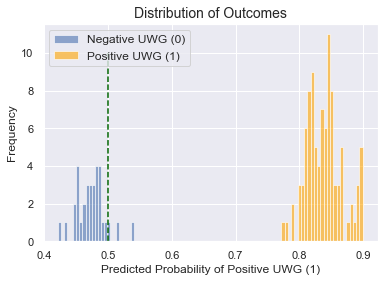

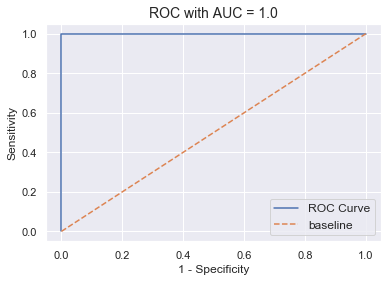

Baseline accuracy for "class_health": 0.6423357664233577
Shape (train/test): (205, 31) (69, 31)
Test Score (min/max): 0.927536231884058  ,  1.0


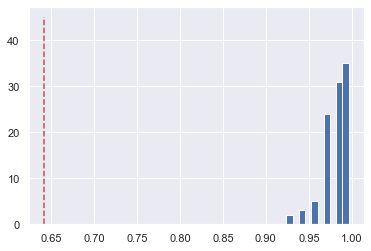

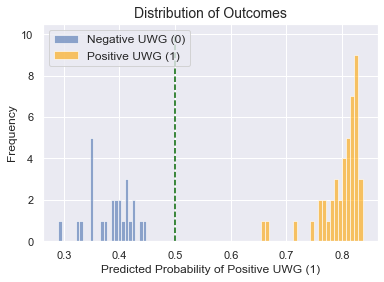

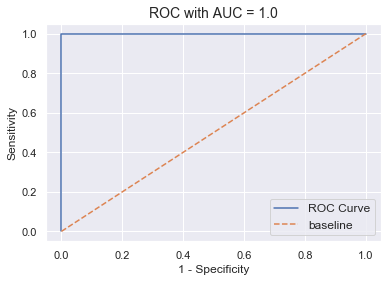

Baseline accuracy for "class_mac": 0.7645739910313901
Shape (train/test): (334, 31) (112, 31)
Test Score (min/max): 0.7767857142857143  ,  0.9821428571428571


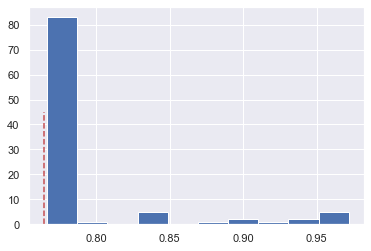

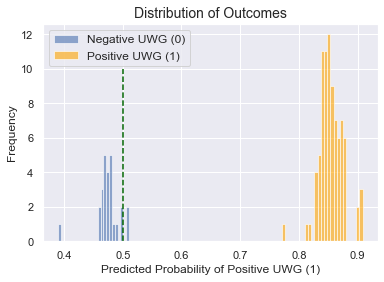

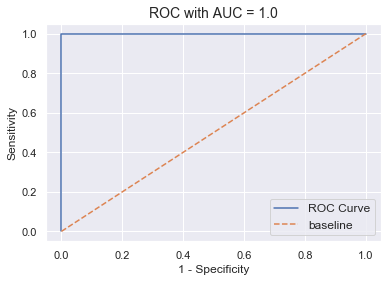

Baseline accuracy for "class_mahl": 0.5260416666666666
Shape (train/test): (288, 31) (96, 31)
Test Score (min/max): 1.0  ,  1.0


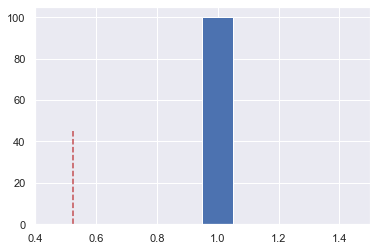

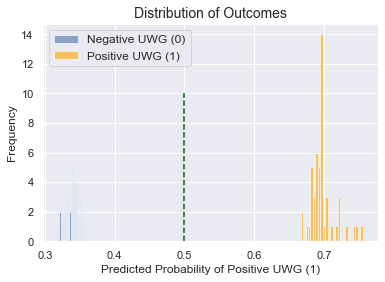

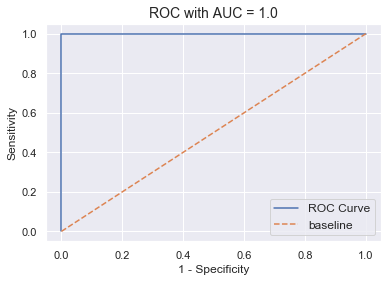

Baseline accuracy for "class_motor": 0.5229007633587787
Shape (train/test): (196, 31) (66, 31)
Test Score (min/max): 1.0  ,  1.0


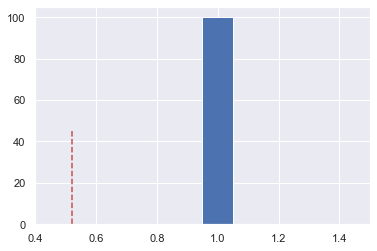

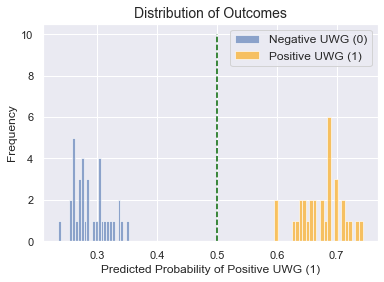

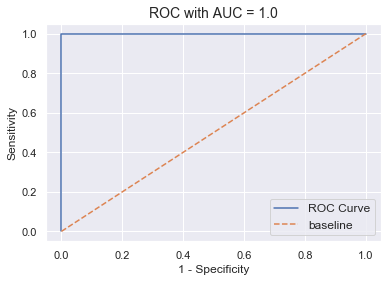

Baseline accuracy for "class_others": 0.7834821428571429
Shape (train/test): (336, 31) (112, 31)
Test Score (min/max): 0.7857142857142857  ,  0.9732142857142857


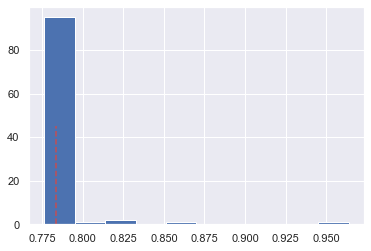

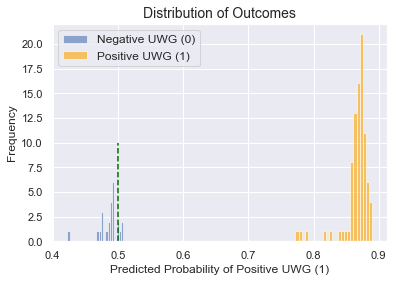

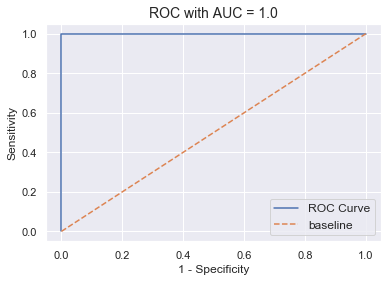

Baseline accuracy for "class_pa": 0.7356948228882834
Shape (train/test): (275, 31) (92, 31)
Test Score (min/max): 0.7608695652173914  ,  1.0


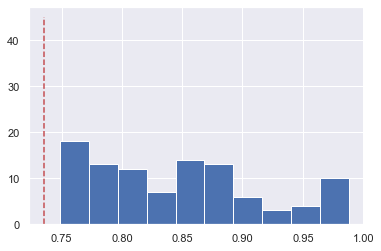

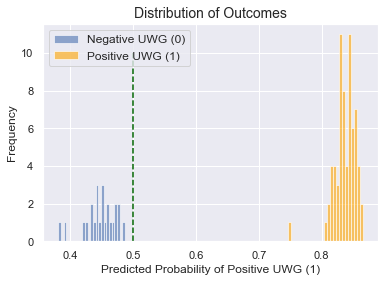

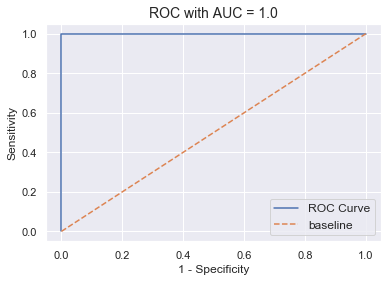

Baseline accuracy for "class_prof_indm": 0.6886446886446886
Shape (train/test): (204, 31) (69, 31)
Test Score (min/max): 0.855072463768116  ,  1.0


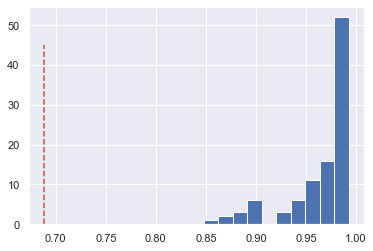

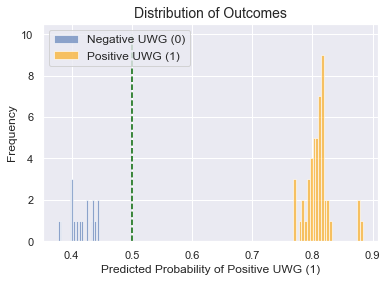

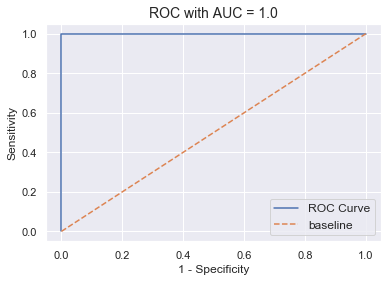

Baseline accuracy for "class_pub_lia": 0.7443181818181818
Shape (train/test): (264, 31) (88, 31)
Test Score (min/max): 0.7386363636363636  ,  0.9659090909090909


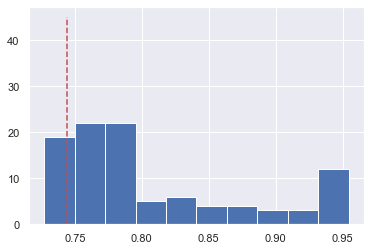

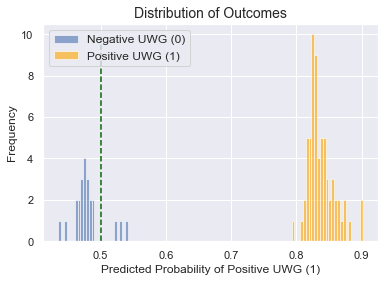

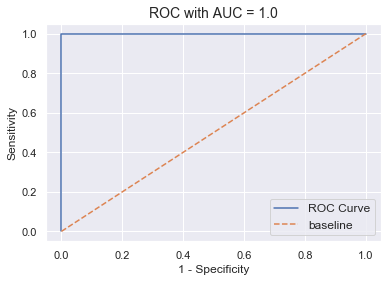

Baseline accuracy for "class_wic": 0.5251256281407035
Shape (train/test): (298, 31) (100, 31)
Test Score (min/max): 0.99  ,  1.0


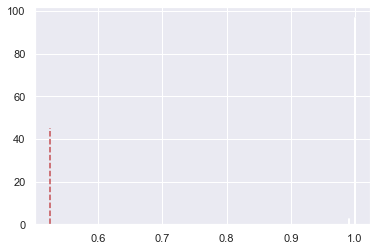

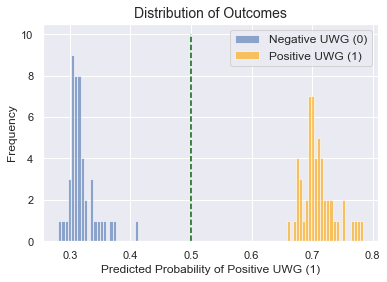

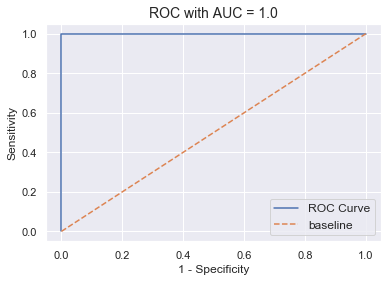

In [26]:
ins_classes = ['class_bonds','class_cnstr_engr','class_cpr','class_fire','class_health',
               'class_mac','class_mahl','class_motor','class_others','class_pa',
               'class_prof_indm','class_pub_lia','class_wic']

df_full = pd.read_csv('../data/df_model_trimmed.csv')
df_full['classification'] = [0 if i<0 else 1 for i in df_full['auwgr']]

for ins_class_item in ins_classes:
    
    df = df_full[df_full[ins_class_item]==1].copy()
    
    baseline = max(df['classification'].value_counts(normalize=True).sort_values())
    print('Baseline accuracy for "'+ins_class_item+'":',baseline)
    
    features = [col for col in df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year')]
    X = df[features]
    y = df['classification']
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
    print('Shape (train/test):',X_train.shape,X_test.shape)

    score_list=[]
    for i in np.arange(0,100,1):
        etcf = ExtraTreesClassifier(bootstrap=True,max_depth=2,min_samples_split=2,
                                    n_estimators=350,oob_score=True,random_state=i)
        etcf.fit(X_train,y_train)
        score_list.append(etcf.score(X_test, y_test))

    print('Test Score (min/max):',min(score_list),' , ',max(score_list))
    plt.hist(score_list,bins=10,align='left')
    plt.vlines(x=baseline,ymin=0,ymax=45,colors='r',linestyles='dashed')
    
    v_line_max = 10
    plot_title = 'Distribution of Outcomes'
    prediction_probabilities = [i[1] for i in etcf.predict_proba(X_test)]
    plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max, (6,4))
    
    plot_title = 'ROC with AUC'
    plot_roc(prediction_probabilities, y_test, plot_title, (6,4))
  
    plt.show()

### (!WIP) Summary of Findings

# Other Models

In [49]:
df = pd.read_csv('../data/df_model_untrimmed.csv')
df['classification'] = [0 if i<0 else 1 for i in df['auwgr']]
features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
X = df[features]
y = df['classification']
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(4764, 30) (1589, 30)
(4764,) (1589,)


## AdaBoost Classifier

In [84]:
abcf= AdaBoostClassifier(base_estimator=DecisionTreeClassifier())
abcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',abcf.score(X_train, y_train),',',abcf.score(X_test, y_test))
# predict & evaluate
predictions = abcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 1.0 , 0.640294388224471

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.44      0.46      0.45       347
Positive AUWGR (1)       0.74      0.72      0.73       740

          accuracy                           0.64      1087
         macro avg       0.59      0.59      0.59      1087
      weighted avg       0.65      0.64      0.64      1087



## Gradient Boosting Classifier

In [86]:
gbcf = GradientBoostingClassifier()
gbcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',gbcf.score(X_train, y_train),',',gbcf.score(X_test, y_test))
# predict & evaluate
predictions = gbcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 0.802760736196319 , 0.7175712971481141

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.57      0.45      0.50       347
Positive AUWGR (1)       0.76      0.84      0.80       740

          accuracy                           0.72      1087
         macro avg       0.67      0.65      0.65      1087
      weighted avg       0.70      0.72      0.71      1087



## K Nearest Neighbors Classifier

In [88]:
knncf = KNeighborsClassifier(n_neighbors=11)
knncf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',knncf.score(X_train, y_train),',',knncf.score(X_test, y_test))
# predict & evaluate
predictions = knncf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 0.7530674846625767 , 0.7046918123275069

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.55      0.40      0.46       347
Positive AUWGR (1)       0.75      0.85      0.80       740

          accuracy                           0.70      1087
         macro avg       0.65      0.62      0.63      1087
      weighted avg       0.69      0.70      0.69      1087



### Plot Distribution of Outcomes

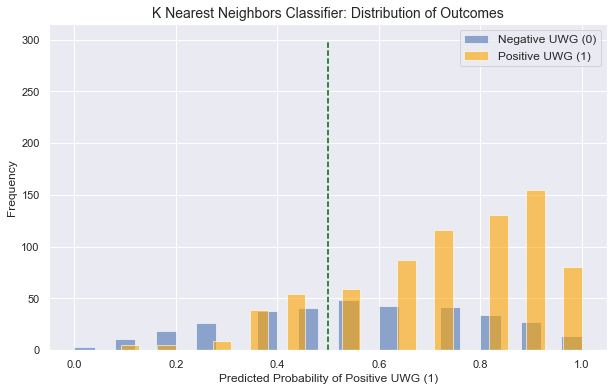

In [89]:
v_line_max = 300
plot_title = 'K Nearest Neighbors Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in knncf.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

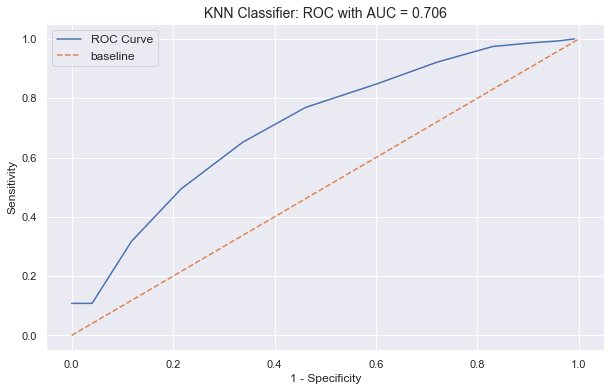

In [90]:
plot_title = 'KNN Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

## Support Vector Classifier

In [91]:
svcf = SVC(gamma='scale')
svcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',svcf.score(X_train, y_train),',',svcf.score(X_test, y_test))
# predict & evaluate
predictions = svcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Negative AUWGR (0)','Positive AUWGR (1)']))

Score(train/test): 0.7079754601226994 , 0.702851885924563

=== Classification Report  ================================
                    precision    recall  f1-score   support

Negative AUWGR (0)       0.66      0.14      0.24       347
Positive AUWGR (1)       0.71      0.96      0.82       740

          accuracy                           0.70      1087
         macro avg       0.68      0.55      0.53      1087
      weighted avg       0.69      0.70      0.63      1087



# (!WIP) CONCLUSION